In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import cv2
import math
import os
import zipfile
import random
import shutil
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/Users/abbyeast/Library/Application Support/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
'''
Set working directory to the Project folder
'''
os.chdir('/Users/abbyeast/Desktop/Fall 24/ML/Project')
print(os.getcwd())  # Verify if it changed

/Users/abbyeast/Desktop/Fall 24/ML/Project


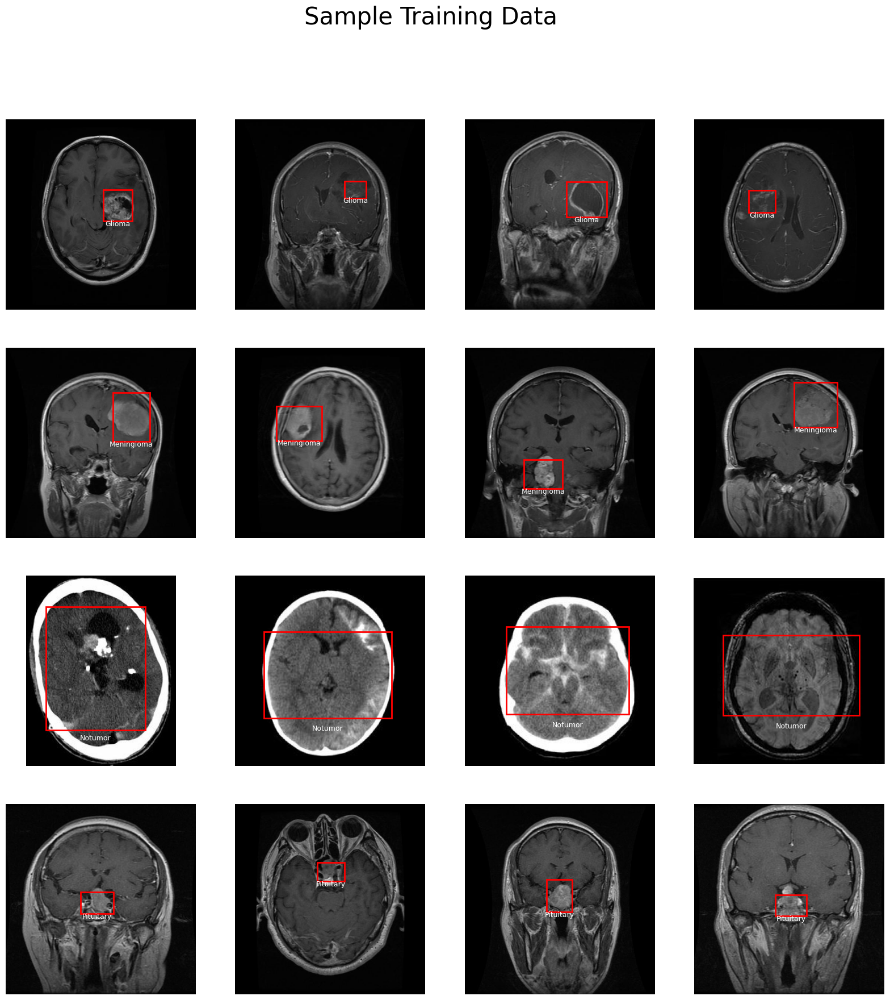

In [15]:
# Plotting the training data with bounding boxes
dataset_directory = 'YoloModel/Brain Tumor labeled dataset'
class_labels = {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for class_name, ax_row in zip(class_labels.keys(), axes):
    class_directory = os.path.join(dataset_directory, class_name)
    image_files = [f for f in os.listdir(class_directory) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, 4)

    for ax, image_file in zip(ax_row, selected_images):
        annotation_file = os.path.join(class_directory, image_file.replace('.jpg', '.txt'))
        with open(annotation_file, 'r') as file:
            line = file.readline().strip().split()
            class_number, centre_x, centre_y, height, width = map(float, line)

        img = plt.imread(os.path.join(class_directory, image_file))

        if len(img.shape) == 2:
            img = np.stack((img,) * 3, axis=-1)

        img_height, img_width, _ = img.shape
        x_min = (centre_x - width / 2) * img_width
        y_min = (centre_y - height / 2) * img_height
        x_max = (centre_x + width / 2) * img_width
        y_max = (centre_y + height / 2) * img_height
        tumor_bbox = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none', label=f'{class_name.capitalize()}')
        ax.imshow(img)
        ax.add_patch(tumor_bbox)

        label_text = f'{class_name.capitalize()}'
        ax.text((x_min + x_max) / 2, y_max + 18, label_text, color='w', ha='center', va='bottom', fontsize=9)

for ax_row in axes:
    for ax in ax_row:
        ax.axis('off')

plt.suptitle("Sample Training Data", fontsize=30)
plt.show()

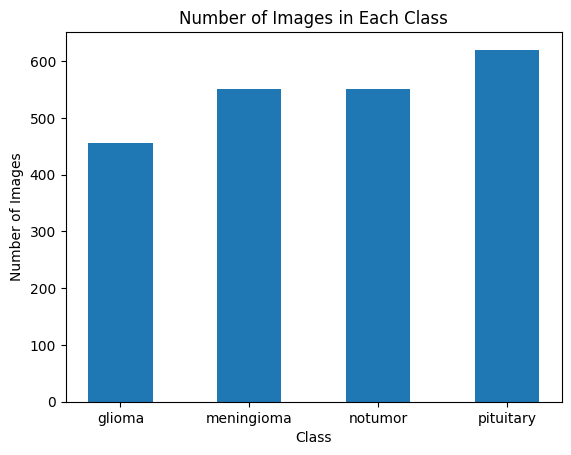

In [16]:
class_names = ['glioma', 'meningioma', 'notumor', 'pituitary']
class_counts = [456, 551, 550, 620]

plt.bar(class_names, class_counts, width=0.5)
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Class')
plt.show()

In [17]:
def custom_train_test_split(dataset_directory, test_ratio=0.2, random_seed=None, min_samples_per_class=2):
    """
    Custom function to perform a stratified train-test split on an image dataset.
    This function organizes the dataset into 'train' and 'test' directories while maintaining the class-wise distribution.
    It creates the 'train' and 'test' directories within the given dataset directory and moves images accordingly.
    """
    random_seed = random_seed or 42

    class_directories = [d for d in os.listdir(dataset_directory) if os.path.isdir(os.path.join(dataset_directory, d))]

    train_directory = os.path.join(dataset_directory, 'train')
    test_directory = os.path.join(dataset_directory, 'test')
    os.makedirs(train_directory, exist_ok=True)
    os.makedirs(test_directory, exist_ok=True)

    for class_dir in class_directories:
        class_path = os.path.join(dataset_directory, class_dir)

        image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

        if len(image_files) < min_samples_per_class:
            continue

        train_images, test_images = train_test_split(image_files, test_size=test_ratio, random_state=random_seed)

        for train_image in train_images:
            src_image_path = os.path.join(class_path, train_image)
            src_annotation_path = os.path.join(class_path, train_image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(train_directory, class_dir, train_image)
            dest_annotation_path = os.path.join(train_directory, class_dir, train_image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

        for test_image in test_images:
            src_image_path = os.path.join(class_path, test_image)
            src_annotation_path = os.path.join(class_path, test_image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(test_directory, class_dir, test_image)
            dest_annotation_path = os.path.join(test_directory, class_dir, test_image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

In [18]:
dataset_directory = 'YoloModel/Brain Tumor labeled dataset/'
custom_train_test_split(dataset_directory, test_ratio=0.2, random_seed=42, min_samples_per_class=2)

In [19]:
def count_images_per_class(directory):
    class_counts = {}
    for class_dir in os.listdir(directory):
        class_path = os.path.join(directory, class_dir)
        if os.path.isdir(class_path):
            class_counts[class_dir] = len([f for f in os.listdir(class_path) if f.endswith('.jpg')])
    return class_counts

In [21]:
print(count_images_per_class('YoloModel/Brain Tumor labeled dataset/train'))
print(count_images_per_class('YoloModel/Brain Tumor labeled dataset/test'))

{'pituitary': 496, 'notumor': 440, 'glioma': 364, 'meningioma': 440}
{'pituitary': 124, 'notumor': 110, 'glioma': 91, 'meningioma': 110}


In [28]:
# Load the pre-trained YOLOv8 nano model
yolo_btd_model = YOLO('yolov8n.pt')

# Train the model on your brain tumor dataset
yolo_btd_model_results = yolo_btd_model.train(
    data= 'YoloModel/brain_tumors.yaml',
    epochs=15
)

Ultralytics 8.3.29 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M3 Pro)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=YoloModel/brain_tumors.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wi

train: Scanning /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/train/glioma... 1740 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1740/1740 [00:00<00:00, 4112.40it/s]

train: New cache created: /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/train/glioma.cache



val: Scanning /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma... 435 images, 0 backgrounds, 0 corrupt: 100%|██████████| 435/435 [00:00<00:00, 4943.18it/s]

val: New cache created: /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma.cache


Plotting labels to runs/detect/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train8
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      1.673      3.233      1.732         28        640: 100%|██████████| 109/109 [08:03<00:00,  4.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.84s/it]

                   all        435        439      0.488      0.454      0.518      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      1.593      2.286       1.64         24        640: 100%|██████████| 109/109 [08:03<00:00,  4.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:54<00:00,  3.87s/it]

                   all        435        439      0.673      0.428      0.471      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      1.622      1.944       1.62         29        640: 100%|██████████| 109/109 [08:00<00:00,  4.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.84s/it]

                   all        435        439      0.749        0.6      0.678      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      1.555       1.66      1.568         26        640: 100%|██████████| 109/109 [07:58<00:00,  4.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.751      0.628      0.691      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/15         0G       1.52        1.5      1.549         29        640: 100%|██████████| 109/109 [07:59<00:00,  4.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.727      0.728      0.759      0.407


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G      1.554      1.406      1.669         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439      0.599      0.638      0.614      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/15         0G      1.514      1.234      1.638         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439        0.8      0.734       0.79      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G      1.477      1.128      1.588         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.864      0.761      0.847      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G      1.431      1.028      1.551         13        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.847      0.795      0.863      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/15         0G      1.407     0.9632      1.537         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.881      0.811      0.863      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G      1.375     0.9198      1.524         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439      0.898      0.822      0.877      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G      1.347     0.8594      1.493         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439      0.893      0.837      0.894      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G       1.32     0.8074       1.45         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.82s/it]

                   all        435        439      0.886      0.851      0.894      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      14/15         0G      1.294     0.7561      1.444         12        640: 100%|██████████| 109/109 [07:57<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439      0.874      0.854       0.89      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G      1.263     0.7259      1.422         12        640: 100%|██████████| 109/109 [07:58<00:00,  4.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:53<00:00,  3.83s/it]

                   all        435        439      0.873      0.851      0.888      0.551

15 epochs completed in 2.220 hours.


Optimizer stripped from runs/detect/train8/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 6.2MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics 8.3.29 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M3 Pro)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:51<00:00,  3.66s/it]


                   all        435        439      0.873      0.851      0.887      0.551
          glioma_tumor        124        124      0.876      0.944      0.913      0.497
      meningioma_tumor        110        110      0.969       0.86      0.964       0.59
              no_tumor         92         96      0.768      0.646      0.712      0.396
       pituitary_tumor        109        109      0.879      0.954      0.959      0.721
Speed: 0.7ms preprocess, 114.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/train8


In [29]:
# Save the model manually after training
yolo_btd_model.save('YoloModel/saved_model_yolov8.pt')

In [30]:
def plot_images(image_paths):
    fig, axes = plt.subplots(len(image_paths), 1, figsize=(80, 80))

    for i, ax in enumerate(axes):
        image_path = image_paths[i]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(os.path.basename(image_path))

    plt.tight_layout()
    plt.show()

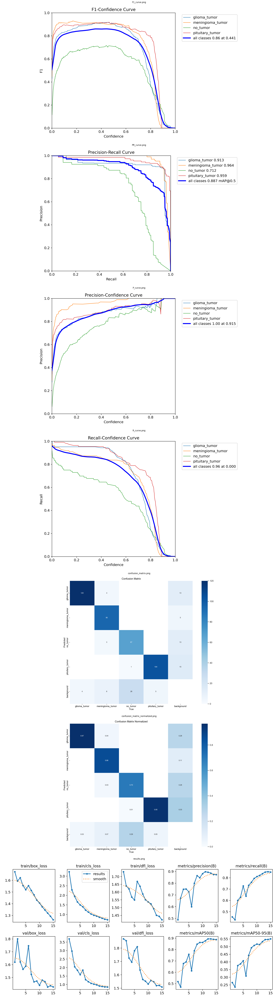

In [32]:
image_paths = [
    'runs/detect/train8/F1_curve.png',
    'runs/detect/train8/PR_curve.png',
    'runs/detect/train8/P_curve.png',
    'runs/detect/train8/R_curve.png',
    'runs/detect/train8/confusion_matrix.png',
    'runs/detect/train8/confusion_matrix_normalized.png',
    'runs/detect/train8/results.png',
]
plot_images(image_paths)

In [35]:
def predict_results(test_images_dir):
    model = YOLO('runs/detect/train8/weights/best.pt')

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(image_path, save=True, imgsz=320, conf=0.3)

In [36]:
glioma_test_dir = 'YoloModel/Brain Tumor labeled dataset/test/glioma'
predict_results(glioma_test_dir)


image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0559.jpg: 320x320 2 no_tumors, 16.3ms
Speed: 0.5ms preprocess, 16.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0405.jpg: 320x320 (no detections), 12.6ms
Speed: 0.6ms preprocess, 12.6ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0377.jpg: 320x320 1 no_tumor, 13.2ms
Speed: 0.5ms preprocess, 13.2ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0376.jpg: 320x320 1 no_tumor, 18.2ms
Spee

In [37]:
meningioma_test_dir = 'YoloModel/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir)


image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/meningioma/Tr-me_0368.jpg: 320x320 (no detections), 12.4ms
Speed: 0.6ms preprocess, 12.4ms inference, 0.1ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict2

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/meningioma/Tr-me_0354.jpg: 320x320 1 meningioma_tumor, 14.4ms
Speed: 0.5ms preprocess, 14.4ms inference, 0.3ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict2

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/meningioma/Tr-me_0383.jpg: 320x320 1 meningioma_tumor, 15.8ms
Speed: 0.6ms preprocess, 15.8ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict2

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/meningioma/Tr-me_0195.jp

In [38]:
pituitary_test_dir = 'YoloModel/Brain Tumor labeled dataset/test/pituitary'
predict_results(pituitary_test_dir)


image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0277.jpg: 320x320 1 glioma_tumor, 15.0ms
Speed: 0.5ms preprocess, 15.0ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict3

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0061.jpg: 320x320 1 glioma_tumor, 17.5ms
Speed: 0.5ms preprocess, 17.5ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict3

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0129.jpg: 320x320 (no detections), 11.6ms
Speed: 0.4ms preprocess, 11.6ms inference, 0.1ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict3

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0060.jpg: 320x320 1

In [39]:
notumor_test_dir = 'YoloModel/Brain Tumor labeled dataset/test/notumor'
predict_results(notumor_test_dir)


image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/notumor/Tr-no_0029.jpg: 320x320 1 pituitary_tumor, 15.5ms
Speed: 0.5ms preprocess, 15.5ms inference, 0.4ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict4

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 320x320 1 pituitary_tumor, 15.3ms
Speed: 0.5ms preprocess, 15.3ms inference, 0.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict4

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/notumor/Tr-no_0439.jpg: 224x320 1 pituitary_tumor, 12.5ms
Speed: 0.6ms preprocess, 12.5ms inference, 0.2ms postprocess per image at shape (1, 3, 224, 320)
Results saved to runs/detect/predict4

image 1/1 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/notumor/Tr-no_0363.jpg: 288x320 1

In [41]:
def get_random_images_from_dir(directory, num_images=5):
    all_images = [f for f in os.listdir(directory) if f.lower().endswith('.jpg')]
    random_images = random.sample(all_images, min(num_images, len(all_images)))
    return [os.path.join(directory, img) for img in random_images]

In [42]:
def display_images(images, num_images_per_row=5):
    fig, axs = plt.subplots(len(images) // num_images_per_row, num_images_per_row, figsize=(30, 30))
    axs = axs.flatten()

    for i, img_path in enumerate(images):
        img = mpimg.imread(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')

    plt.show()

In [49]:
# Load your trained YOLOv8 model
yolo_btd_model = YOLO('runs/detect/train8/weights/best.pt')

# Define the path to the test directory and subfolders
test_dir = 'YoloModel/Brain Tumor labeled dataset/test'
subfolders = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Iterate through each class folder and make predictions
for subfolder in subfolders:
    folder_path = os.path.join(test_dir, subfolder)
    if os.path.exists(folder_path):
        print(f"Running predictions on: {subfolder}")

        # Run predictions on the specific subfolder
        yolo_btd_model.predict(
            source=folder_path,   # Test dataset directory
            save=True,            # Save images with bounding boxes
            save_txt=True,        # Save detections as text files
            conf=0.25,            # Confidence threshold for predictions
            project='runs/detect', # Save to this directory
            name=f'test_bboxes_{subfolder}', # Unique name for each subfolder
            exist_ok=True         # Allow overwriting if folder exists
        )
    else:
        print(f"Directory not found: {folder_path}")


Running predictions on: glioma

image 1/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0011.jpg: 640x640 (no detections), 47.0ms
image 2/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0014.jpg: 640x640 1 no_tumor, 44.3ms
image 3/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0018.jpg: 640x640 1 no_tumor, 42.3ms
image 4/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0019.jpg: 640x640 2 no_tumors, 47.7ms
image 5/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0020.jpg: 640x640 1 no_tumor, 53.0ms
image 6/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labeled dataset/test/glioma/Tr-gl_0024.jpg: 640x640 1 no_tumor, 43.2ms
image 7/91 /Users/abbyeast/Desktop/Fall 24/ML/Project/YoloModel/Brain Tumor labe

Displaying predictions from: test_bboxes_glioma


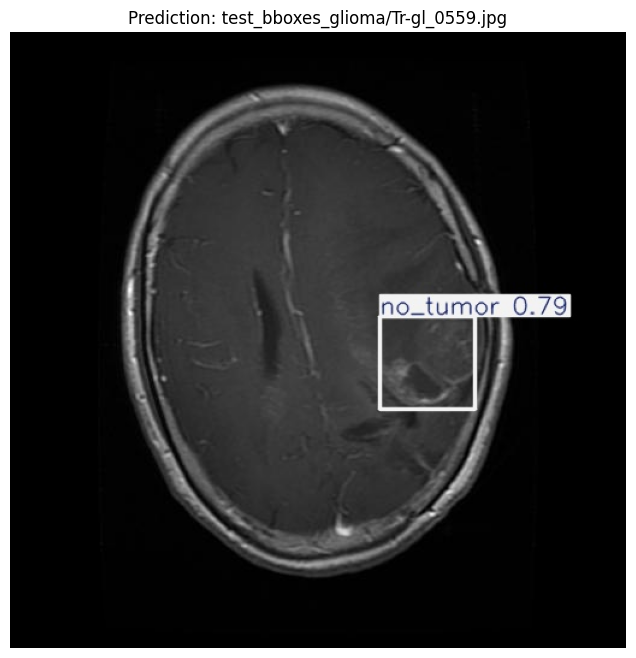

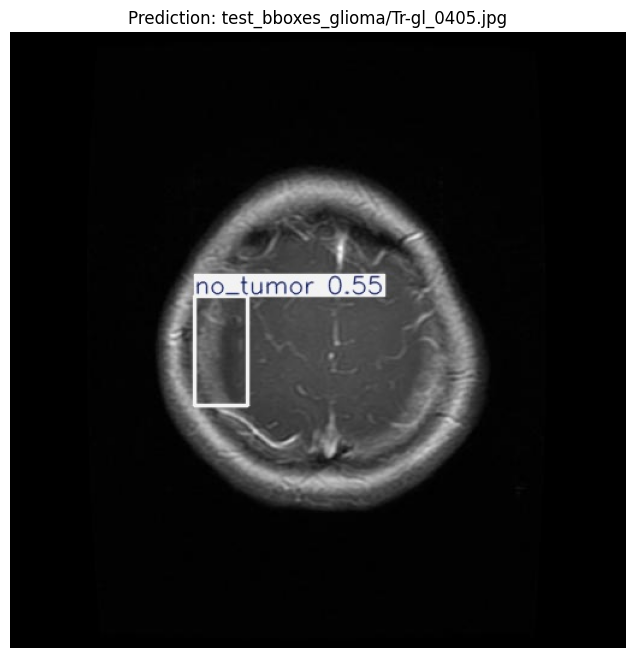

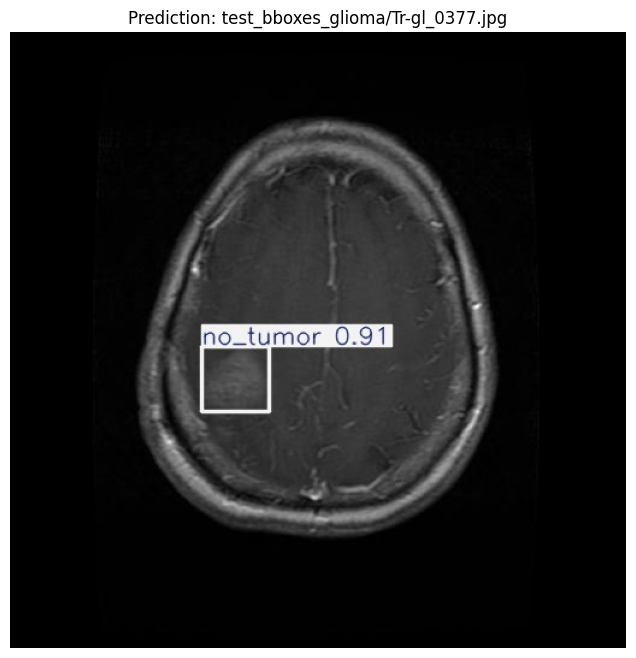

Displaying predictions from: test_bboxes_meningioma


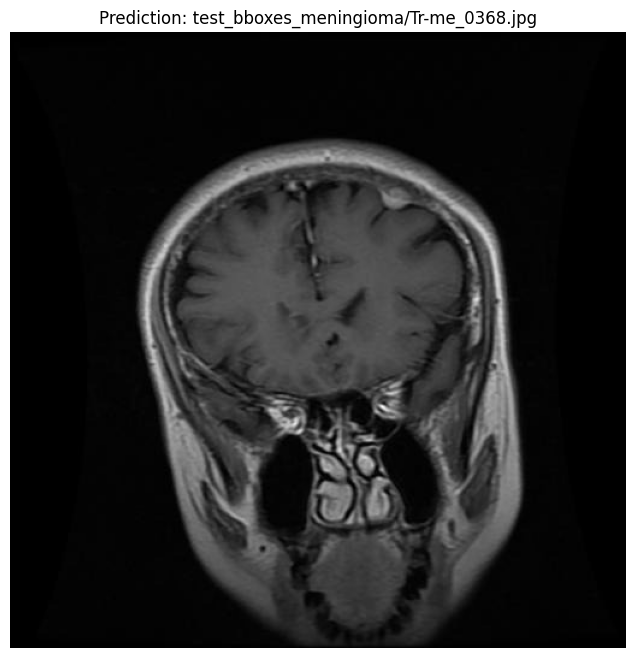

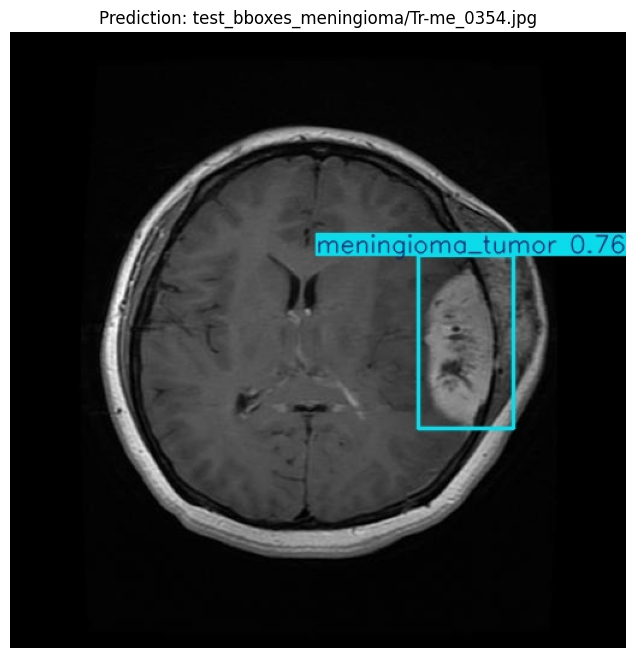

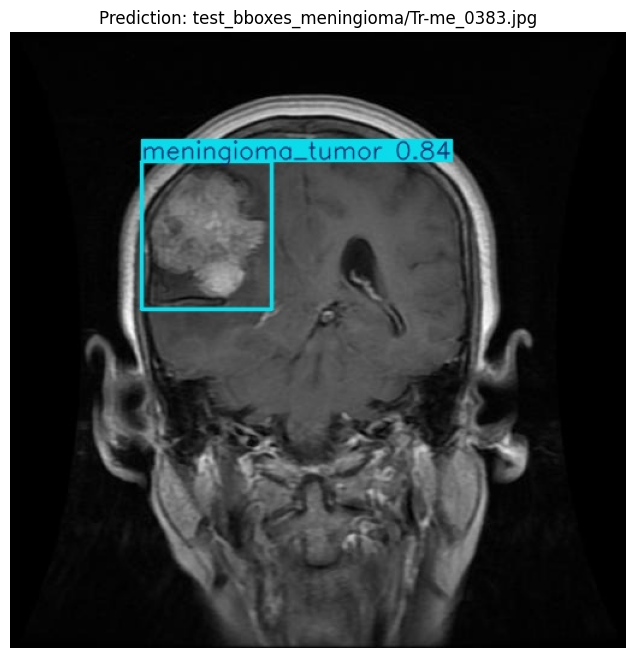

Displaying predictions from: test_bboxes_notumor


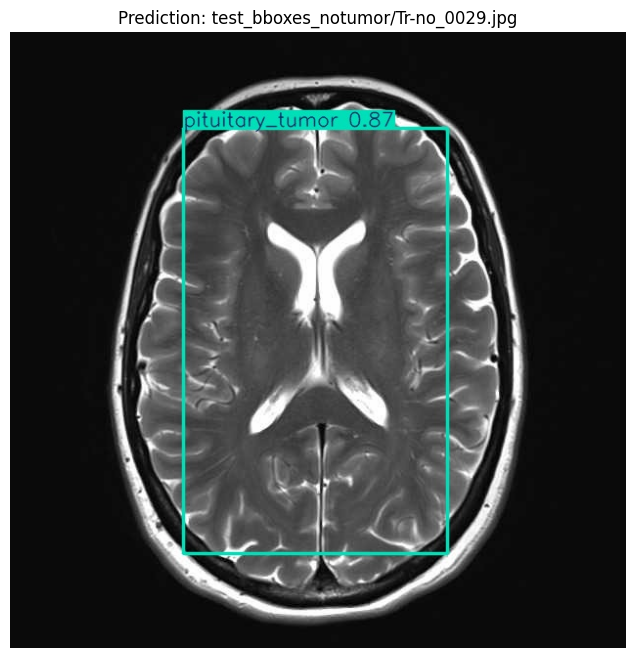

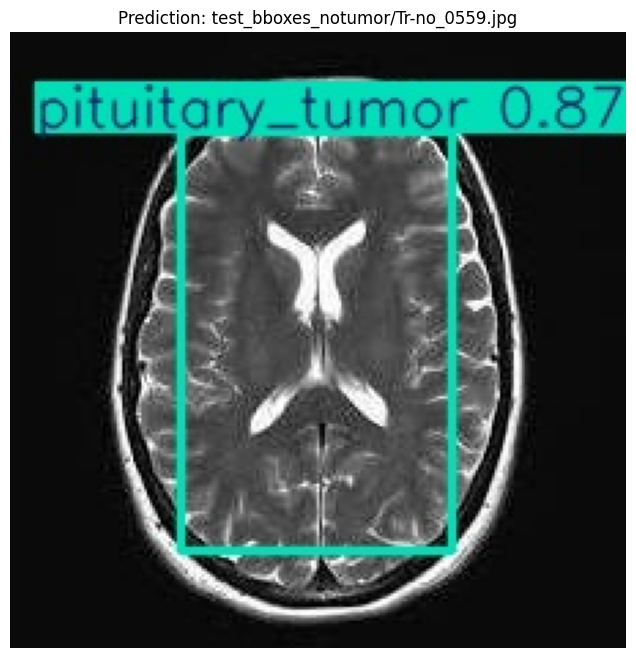

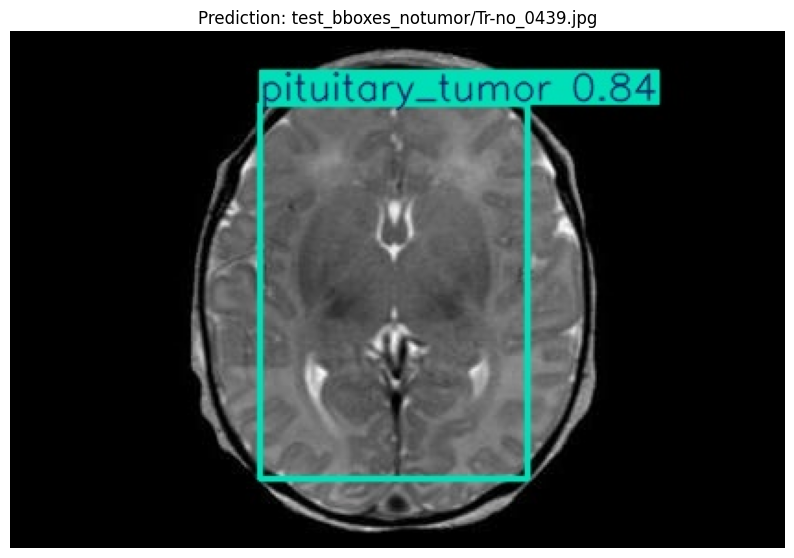

Displaying predictions from: test_bboxes_pituitary


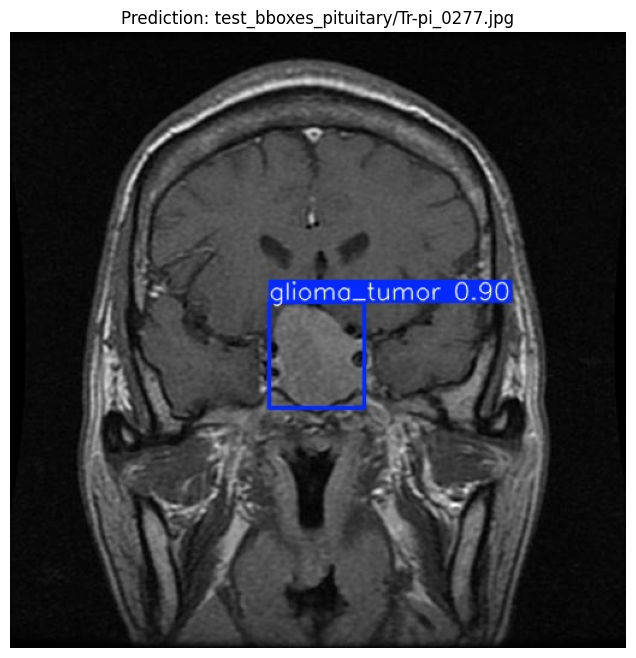

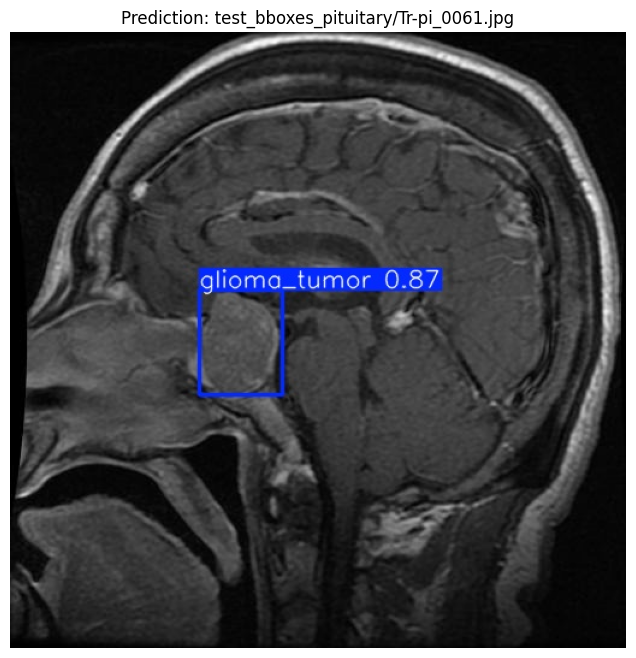

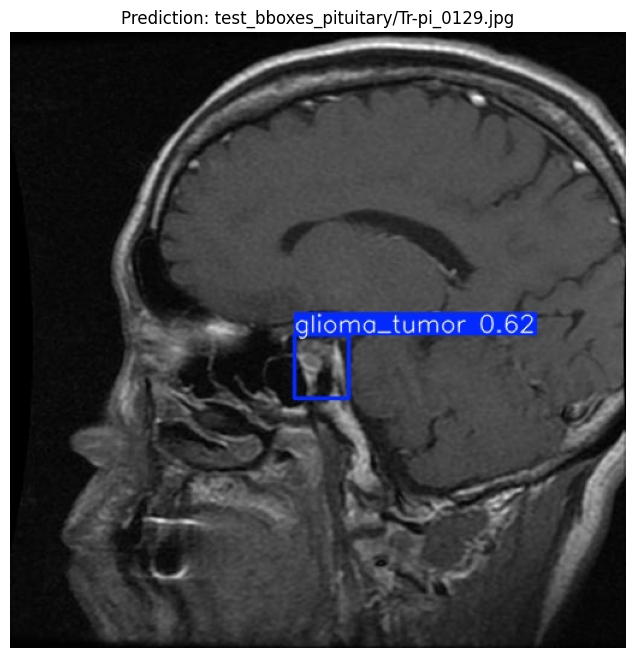

In [51]:
import os
import cv2
import matplotlib.pyplot as plt

# Define the path to the output directory and subfolders
output_base_dir = 'runs/detect'
subfolders = ['test_bboxes_glioma', 'test_bboxes_meningioma', 'test_bboxes_notumor', 'test_bboxes_pituitary']

# Function to display sample images with predictions
def display_predictions(output_base_dir, subfolders, num_images=3):
    for subfolder in subfolders:
        predictions_dir = os.path.join(output_base_dir, subfolder)
        if os.path.exists(predictions_dir):
            print(f"Displaying predictions from: {subfolder}")

            # Get a list of image files in the predictions directory
            image_files = [f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

            # If there are no images, skip this subfolder
            if len(image_files) == 0:
                print(f"No images found in {predictions_dir}")
                continue

            # Select a few images to display
            selected_images = image_files[:num_images]

            # Display each image with bounding boxes
            for img_file in selected_images:
                img_path = os.path.join(predictions_dir, img_file)
                img = cv2.imread(img_path)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
                plt.figure(figsize=(10, 8))
                plt.imshow(img_rgb)
                plt.title(f"Prediction: {subfolder}/{img_file}")
                plt.axis('off')
                plt.show()
        else:
            print(f"Directory not found: {predictions_dir}")

# Display predictions from each subfolder
display_predictions(output_base_dir, subfolders)



Comparing predictions with ground truth for: test_bboxes_glioma


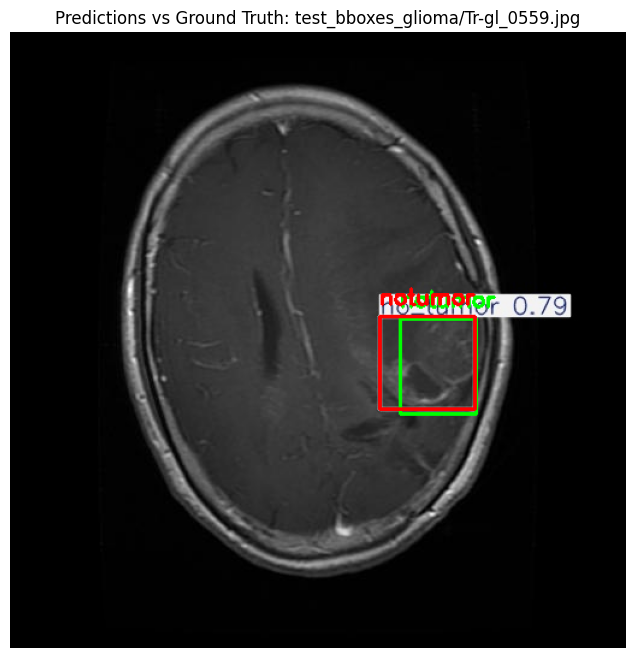

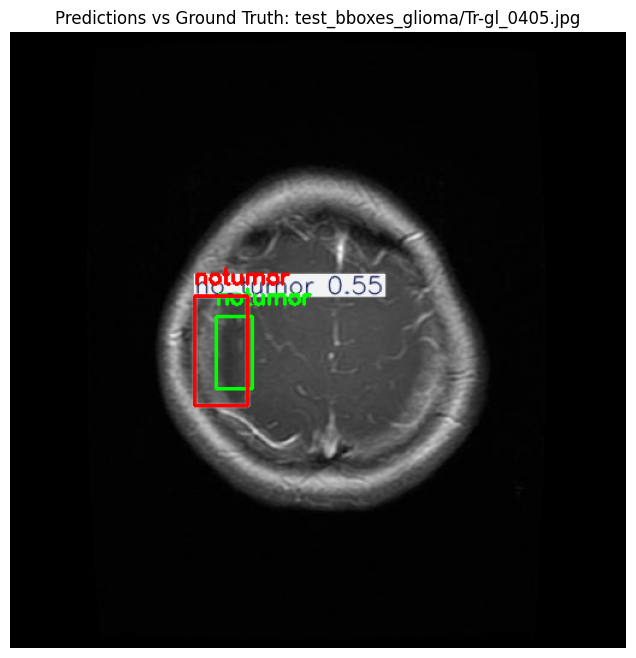

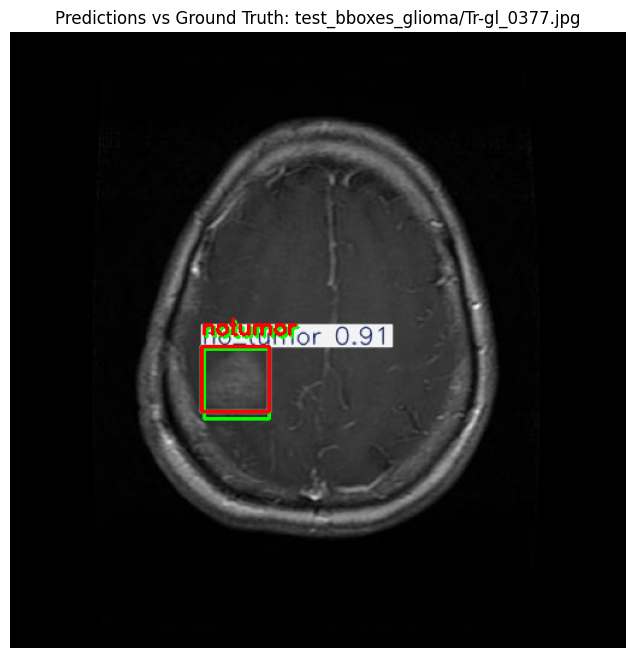

Comparing predictions with ground truth for: test_bboxes_meningioma


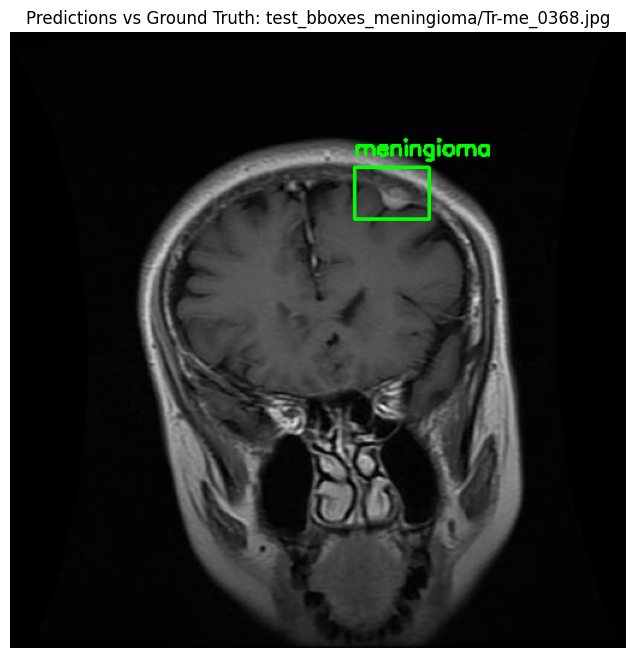

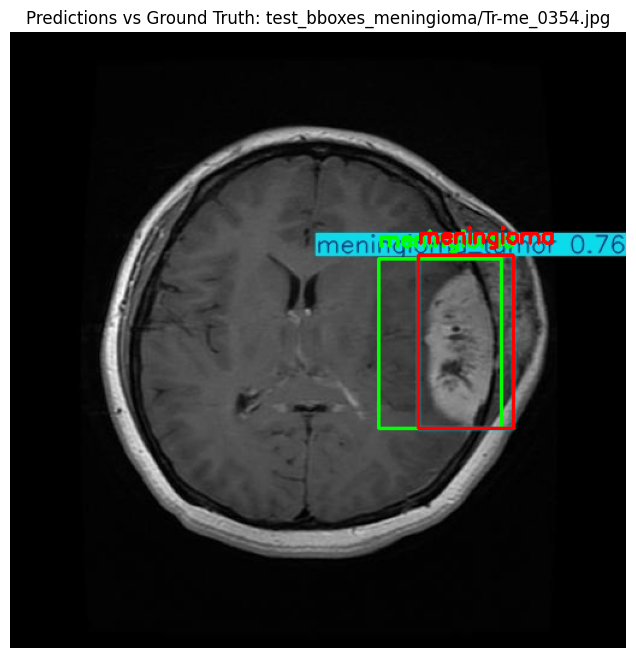

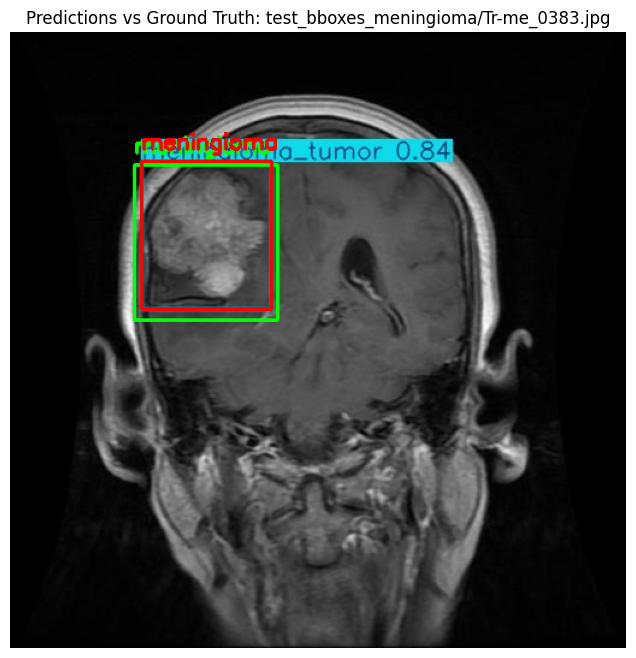

Comparing predictions with ground truth for: test_bboxes_notumor


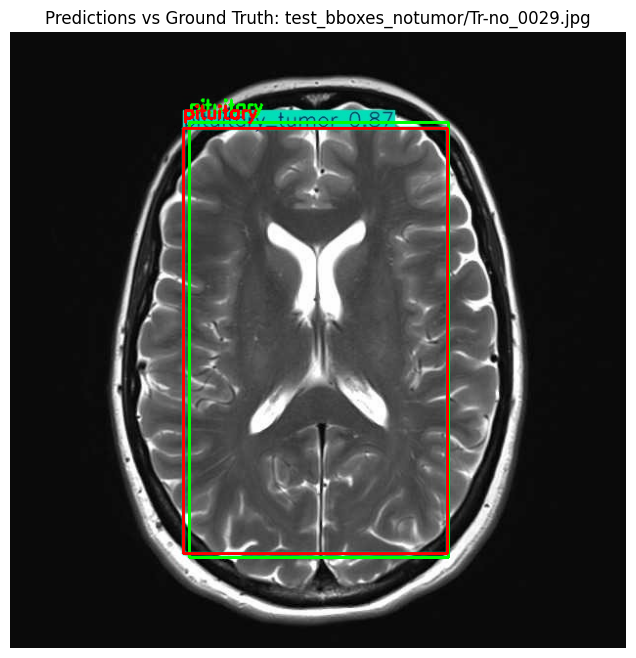

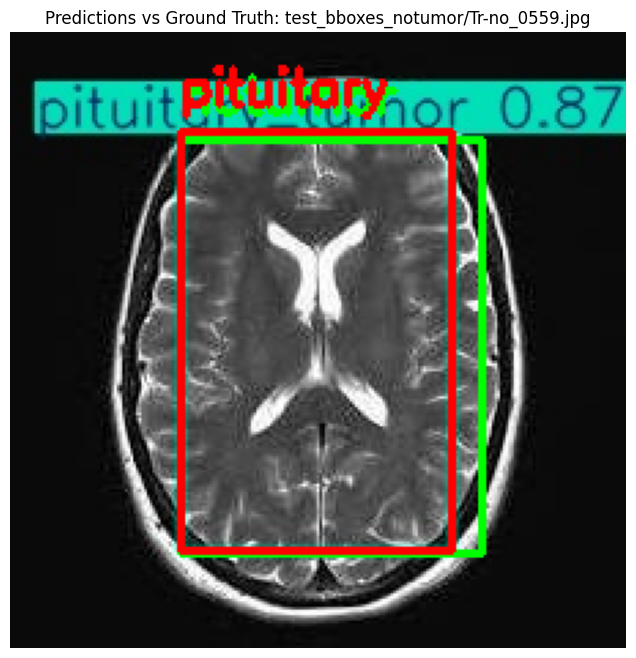

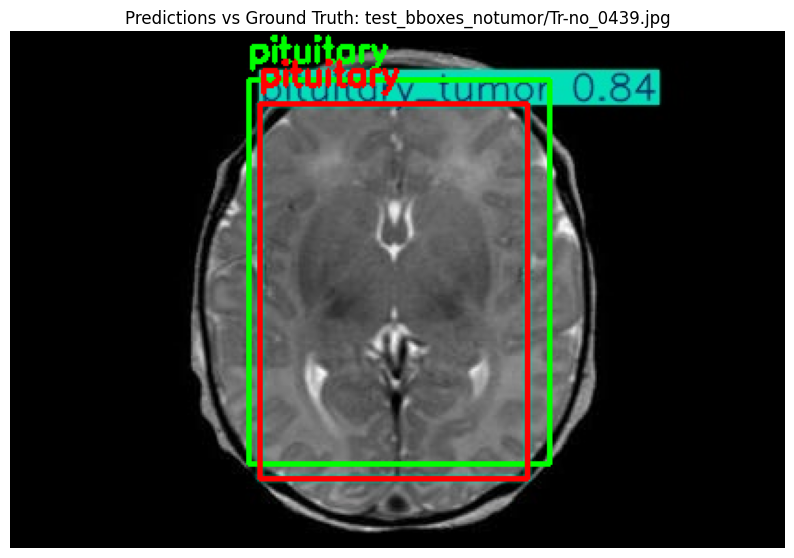

Comparing predictions with ground truth for: test_bboxes_pituitary


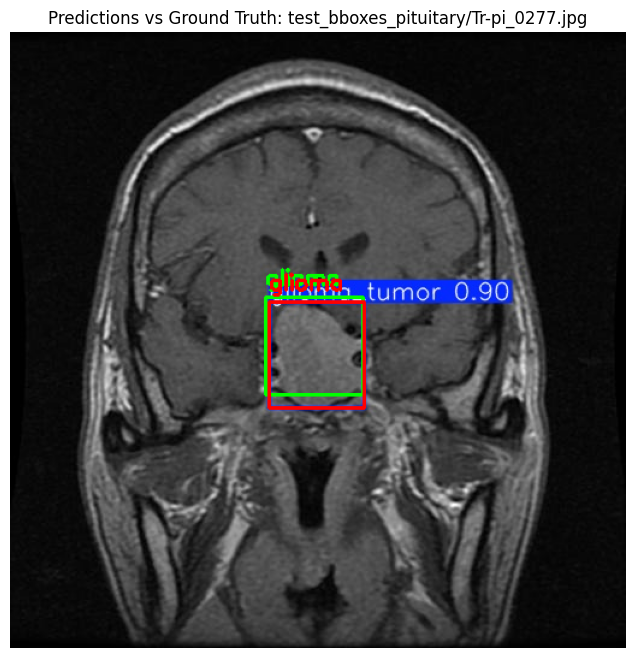

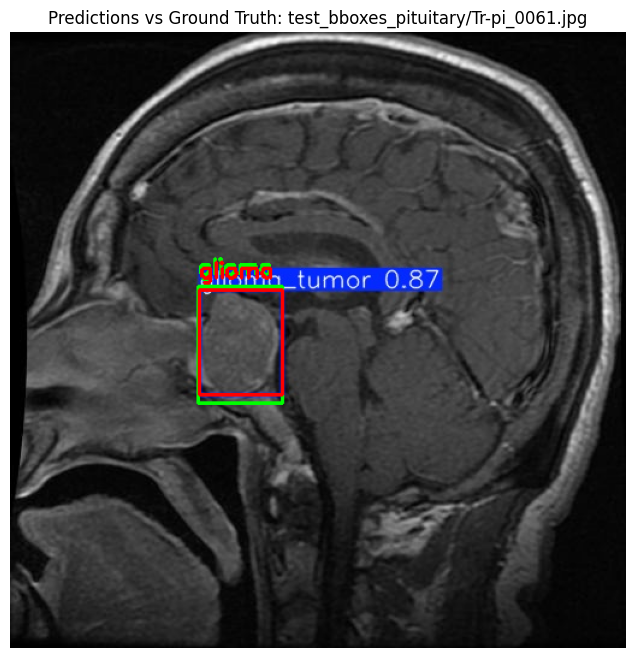

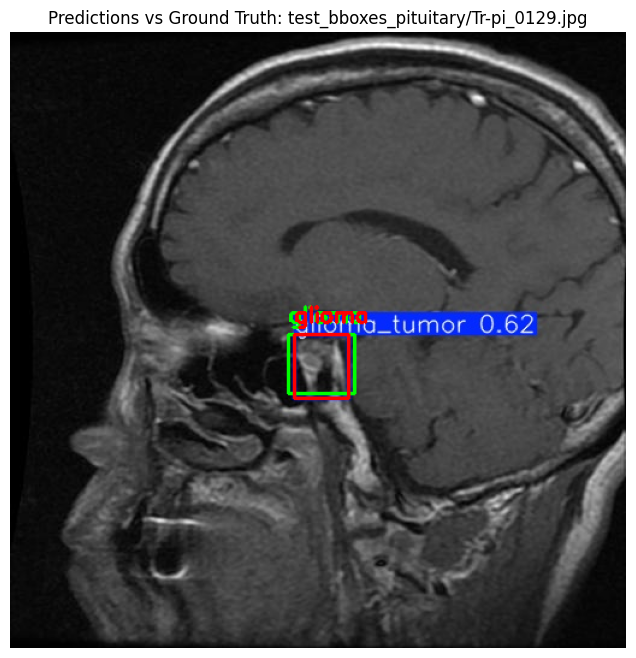

In [52]:
import os
import cv2
import matplotlib.pyplot as plt

# Function to load bounding boxes from a YOLO format .txt file
def load_bounding_boxes(txt_path):
    boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as file:
            for line in file:
                data = line.strip().split()
                class_id = int(data[0])
                bbox = [float(x) for x in data[1:]]
                boxes.append((class_id, bbox))
    return boxes

# Function to draw bounding boxes on an image
def draw_boxes(image, boxes, color, label_map):
    height, width, _ = image.shape
    for class_id, bbox in boxes:
        x_center, y_center, w, h = bbox
        x1 = int((x_center - w / 2) * width)
        y1 = int((y_center - h / 2) * height)
        x2 = int((x_center + w / 2) * width)
        y2 = int((y_center + h / 2) * height)
        class_label = label_map.get(class_id, str(class_id))
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, class_label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Define the path to the test images and labels
output_base_dir = 'runs/detect'
test_dir = 'YoloModel/Brain Tumor labeled dataset/test'
subfolders = ['test_bboxes_glioma', 'test_bboxes_meningioma', 'test_bboxes_notumor', 'test_bboxes_pituitary']
label_map = {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}  # Update with your class labels

# Function to display predictions with ground truth comparison
def display_predictions_with_truth(output_base_dir, test_dir, subfolders, num_images=3):
    for subfolder in subfolders:
        predictions_dir = os.path.join(output_base_dir, subfolder)
        ground_truth_dir = os.path.join(test_dir, subfolder.split('_')[-1])  # Extract class name from folder name

        if os.path.exists(predictions_dir):
            print(f"Comparing predictions with ground truth for: {subfolder}")

            image_files = [f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
            selected_images = image_files[:num_images]

            for img_file in selected_images:
                img_path = os.path.join(predictions_dir, img_file)
                gt_txt_path = os.path.join(ground_truth_dir, img_file.replace('.png', '.txt').replace('.jpg', '.txt'))
                pred_txt_path = os.path.join(predictions_dir, 'labels', img_file.replace('.png', '.txt').replace('.jpg', '.txt'))

                # Load image, ground truth, and predicted boxes
                img = cv2.imread(img_path)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ground_truth_boxes = load_bounding_boxes(gt_txt_path)
                predicted_boxes = load_bounding_boxes(pred_txt_path)

                # Draw ground truth (green) and predicted (red) boxes
                draw_boxes(img_rgb, ground_truth_boxes, (0, 255, 0), label_map)  # Green for ground truth
                draw_boxes(img_rgb, predicted_boxes, (255, 0, 0), label_map)      # Red for predictions

                # Display the image
                plt.figure(figsize=(10, 8))
                plt.imshow(img_rgb)
                plt.title(f"Predictions vs Ground Truth: {subfolder}/{img_file}")
                plt.axis('off')
                plt.show()
        else:
            print(f"Directory not found: {predictions_dir}")

# Display predictions and ground truth for each subfolder
display_predictions_with_truth(output_base_dir, test_dir, subfolders)


Displaying incorrect predictions for: test_bboxes_glioma


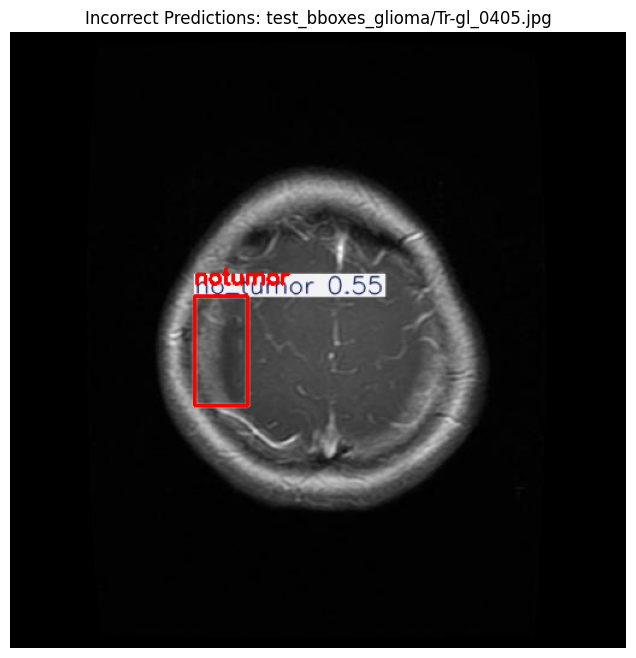

Displaying incorrect predictions for: test_bboxes_meningioma
Displaying incorrect predictions for: test_bboxes_notumor
Displaying incorrect predictions for: test_bboxes_pituitary


In [53]:
import os
import cv2
import matplotlib.pyplot as plt

# Function to load bounding boxes from a YOLO format .txt file
def load_bounding_boxes(txt_path):
    boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as file:
            for line in file:
                data = line.strip().split()
                class_id = int(data[0])
                bbox = [float(x) for x in data[1:]]
                boxes.append((class_id, bbox))
    return boxes

# Function to compute the Intersection over Union (IoU)
def compute_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert from center width-height to corner points
    x1_min, y1_min = x1 - w1 / 2, y1 - h1 / 2
    x1_max, y1_max = x1 + w1 / 2, y1 + h1 / 2
    x2_min, y2_min = x2 - w2 / 2, y2 - h2 / 2
    x2_max, y2_max = x2 + w2 / 2, y2 + h2 / 2

    # Compute the intersection area
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    # Check if there is an intersection
    inter_width = max(0, inter_x_max - inter_x_min)
    inter_height = max(0, inter_y_max - inter_y_min)
    intersection_area = inter_width * inter_height

    # Compute the areas of both boxes
    box1_area = w1 * h1
    box2_area = w2 * h2

    # Compute IoU
    iou = intersection_area / (box1_area + box2_area - intersection_area)
    return iou

# Function to draw bounding boxes on an image
def draw_boxes(image, boxes, color, label_map):
    height, width, _ = image.shape
    for class_id, bbox in boxes:
        x_center, y_center, w, h = bbox
        x1 = int((x_center - w / 2) * width)
        y1 = int((y_center - h / 2) * height)
        x2 = int((x_center + w / 2) * width)
        y2 = int((y_center + h / 2) * height)
        class_label = label_map.get(class_id, str(class_id))
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, class_label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Define the path to the test images and labels
output_base_dir = 'runs/detect'
test_dir = 'YoloModel/Brain Tumor labeled dataset/test'
subfolders = ['test_bboxes_glioma', 'test_bboxes_meningioma', 'test_bboxes_notumor', 'test_bboxes_pituitary']
label_map = {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}  # Update with your class labels

# Function to display incorrect predictions
def display_incorrect_predictions(output_base_dir, test_dir, subfolders, num_images=3, iou_threshold=0.5):
    for subfolder in subfolders:
        predictions_dir = os.path.join(output_base_dir, subfolder)
        ground_truth_dir = os.path.join(test_dir, subfolder.split('_')[-1])  # Extract class name from folder name

        if os.path.exists(predictions_dir):
            print(f"Displaying incorrect predictions for: {subfolder}")

            image_files = [f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
            selected_images = image_files[:num_images]

            for img_file in selected_images:
                img_path = os.path.join(predictions_dir, img_file)
                gt_txt_path = os.path.join(ground_truth_dir, img_file.replace('.png', '.txt').replace('.jpg', '.txt'))
                pred_txt_path = os.path.join(predictions_dir, 'labels', img_file.replace('.png', '.txt').replace('.jpg', '.txt'))

                # Load image, ground truth, and predicted boxes
                img = cv2.imread(img_path)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ground_truth_boxes = load_bounding_boxes(gt_txt_path)
                predicted_boxes = load_bounding_boxes(pred_txt_path)

                incorrect_predictions = []

                # Compare each predicted box with ground truth boxes using IoU
                for pred_class_id, pred_bbox in predicted_boxes:
                    best_iou = 0
                    for gt_class_id, gt_bbox in ground_truth_boxes:
                        iou = compute_iou(pred_bbox, gt_bbox)
                        if iou > best_iou:
                            best_iou = iou
                    if best_iou < iou_threshold:
                        incorrect_predictions.append((pred_class_id, pred_bbox))

                # If there are incorrect predictions, draw them
                if incorrect_predictions:
                    draw_boxes(img_rgb, incorrect_predictions, (255, 0, 0), label_map)  # Red for incorrect predictions

                    # Display the image with incorrect predictions
                    plt.figure(figsize=(10, 8))
                    plt.imshow(img_rgb)
                    plt.title(f"Incorrect Predictions: {subfolder}/{img_file}")
                    plt.axis('off')
                    plt.show()

        else:
            print(f"Directory not found: {predictions_dir}")

# Display incorrect predictions for each subfolder
display_incorrect_predictions(output_base_dir, test_dir, subfolders)


Evaluating predictions for: test_bboxes_glioma
Evaluating predictions for: test_bboxes_meningioma
Evaluating predictions for: test_bboxes_notumor
Evaluating predictions for: test_bboxes_pituitary
Accuracy: 88.05%


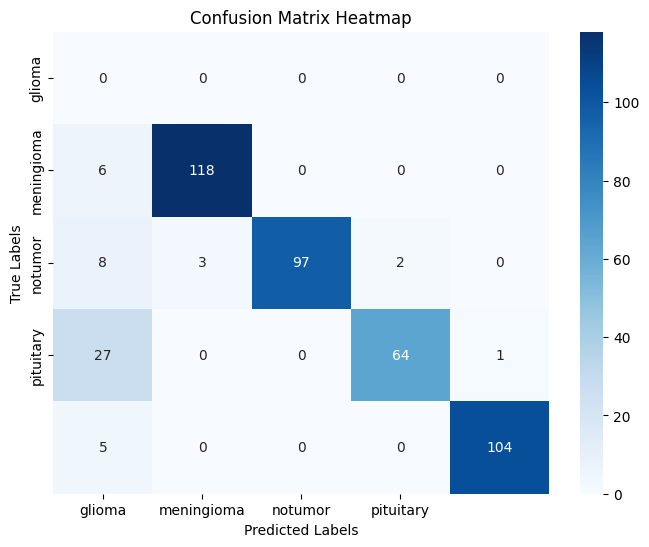

In [55]:
import os
import cv2
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score

# Function to load bounding boxes from a YOLO format .txt file
def load_bounding_boxes(txt_path):
    boxes = []
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as file:
            for line in file:
                data = line.strip().split()
                class_id = int(data[0])
                bbox = [float(x) for x in data[1:]]
                boxes.append((class_id, bbox))
    return boxes

# Function to compute the Intersection over Union (IoU)
def compute_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert from center width-height to corner points
    x1_min, y1_min = x1 - w1 / 2, y1 - h1 / 2
    x1_max, y1_max = x1 + w1 / 2, y1 + h1 / 2
    x2_min, y2_min = x2 - w2 / 2, y2 - h2 / 2
    x2_max, y2_max = x2 + w2 / 2, y2 + h2 / 2

    # Compute the intersection area
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    # Check if there is an intersection
    inter_width = max(0, inter_x_max - inter_x_min)
    inter_height = max(0, inter_y_max - inter_y_min)
    intersection_area = inter_width * inter_height

    # Compute the areas of both boxes
    box1_area = w1 * h1
    box2_area = w2 * h2

    # Compute IoU
    iou = intersection_area / (box1_area + box2_area - intersection_area)
    return iou

# Define the path to the test images and labels
output_base_dir = 'runs/detect'
test_dir = 'YoloModel/Brain Tumor labeled dataset/test'
subfolders = ['test_bboxes_glioma', 'test_bboxes_meningioma', 'test_bboxes_notumor', 'test_bboxes_pituitary']
label_map = {0: 'glioma', 1: 'meningioma', 2: 'notumor', 3: 'pituitary'}  # Update with your class labels

# Function to evaluate the model's accuracy and generate confusion matrix
def evaluate_model_accuracy(output_base_dir, test_dir, subfolders, iou_threshold=0.5):
    all_true_labels = []
    all_pred_labels = []

    for subfolder in subfolders:
        predictions_dir = os.path.join(output_base_dir, subfolder)
        ground_truth_dir = os.path.join(test_dir, subfolder.split('_')[-1])  # Extract class name from folder name

        if os.path.exists(predictions_dir):
            print(f"Evaluating predictions for: {subfolder}")

            image_files = [f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

            for img_file in image_files:
                gt_txt_path = os.path.join(ground_truth_dir, img_file.replace('.png', '.txt').replace('.jpg', '.txt'))
                pred_txt_path = os.path.join(predictions_dir, 'labels', img_file.replace('.png', '.txt').replace('.jpg', '.txt'))

                # Load ground truth and predicted boxes
                ground_truth_boxes = load_bounding_boxes(gt_txt_path)
                predicted_boxes = load_bounding_boxes(pred_txt_path)

                # Check if there are any ground truth boxes
                if ground_truth_boxes:
                    true_class = ground_truth_boxes[0][0]  # Assuming one object per image (adjust as needed)
                else:
                    true_class = -1  # If no ground truth box, label as -1

                # Compare each predicted box with ground truth boxes using IoU
                predicted_class = -1
                for pred_class_id, pred_bbox in predicted_boxes:
                    best_iou = 0
                    for gt_class_id, gt_bbox in ground_truth_boxes:
                        iou = compute_iou(pred_bbox, gt_bbox)
                        if iou > best_iou:
                            best_iou = iou
                    if best_iou >= iou_threshold:
                        predicted_class = pred_class_id
                        break

                # Append true and predicted labels
                all_true_labels.append(true_class)
                all_pred_labels.append(predicted_class)

        else:
            print(f"Directory not found: {predictions_dir}")

    # Compute confusion matrix
    cm = confusion_matrix(all_true_labels, all_pred_labels)
    accuracy = accuracy_score(all_true_labels, all_pred_labels)
    print(f"Accuracy: {accuracy * 100:.2f}%")

    # Plot confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_map.values(), yticklabels=label_map.values())
    plt.title("Confusion Matrix Heatmap")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

# Evaluate the model and display confusion matrix as heatmap
evaluate_model_accuracy(output_base_dir, test_dir, subfolders)
